# Sentiment Analysis Project


## Import Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd /content/gdrive/MyDrive/Sentiment_Analysis/

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/MyDrive/Sentiment_Analysis


In [ ]:
!pip install Unidecode
!pip install tensorflow-text
!pip install contractions
!pip install pyspellchecker
!pip install wordninja
!pip install transformers
!pip install autocorrect
from autocorrect import Speller
import pandas as pd
import wordninja
import textblob
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.util import mark_negation
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
from textblob import TextBlob
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
import sys
import tweepy
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import nltk
import re
import string
import unidecode
import contractions
from xgboost import XGBClassifier
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.stem import SnowballStemmer
from sklearn.model_selection import train_test_split
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from gensim.models import Word2Vec
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from sklearn import svm, datasets
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from spellchecker import SpellChecker
import spacy
import pandas as pd # provide sql-like data manipulation tools. very handy.
pd.options.mode.chained_assignment = None
import numpy as np # high dimensional vector computing library.
from copy import deepcopy
from string import punctuation
from random import shuffle
import gensim
from gensim.models.word2vec import Word2Vec # the word2vec model gensim class
from tqdm import tqdm
tqdm.pandas(desc="progress-bar")
from nltk.tokenize import TweetTokenizer # a tweet tokenizer from nltk.
tokenizer = TweetTokenizer()
from keras.layers import LSTM, Activation, Dropout, Dense, Input, Conv1D, MaxPooling1D, GlobalMaxPooling1D
from keras.models import Model
import string
import re
from nltk import pos_tag
import keras
from keras.layers import Embedding
from keras.preprocessing.text import Tokenizer
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
from keras import regularizers
from keras.layers import Embedding
from keras.utils import to_categorical
from keras.models import Sequential
from keras import layers
from keras import regularizers
from keras import backend as K
from keras.callbacks import ModelCheckpoint

nlp = spacy.load('en_core_web_sm')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

# Get the dataframes from the input file
file_name = 'training-Obama-Romney-tweets.xlsx'
xls = pd.ExcelFile(file_name)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Preprocessing


In [ ]:
# Preprocess Obama's tweets
df_obama = pd.read_excel(xls, 'Obama')
df_romney = pd.read_excel(xls, 'Romney')

# Rename the columns
df_obama = df_obama.drop(df_obama.columns[[0, 5]], axis=1)
df_obama = df_obama.rename(columns={df_obama.columns[2]: 'text', df_obama.columns[3]:'class'})
df_romney = df_romney.drop(df_romney.columns[[0, 5]], axis=1)
df_romney = df_romney.rename(columns={df_romney.columns[2]: 'text', df_romney.columns[3]:'class'})

# Drop the first row
df_obama = df_obama.drop(0)
df_romney = df_romney.drop(0)

# Drop null rows - with reference to class and text
df_obama = df_obama.dropna(subset=['class', 'text'])
df_romney = df_romney.dropna(subset=['class', 'text'])
assert df_obama[df_obama['class'].isna()].empty == True
assert df_obama[df_obama['text'].isna()].empty == True
assert df_romney[df_romney['class'].isna()].empty == True
assert df_romney[df_romney['text'].isna()].empty == True

# Drop rows whose class is different from 0,1,-1 - no information added to the classification task
classes = [0, 1, -1]
df_obama = df_obama[df_obama['class'].isin(classes)]
df_romney = df_romney[df_romney['class'].isin(classes)]

# remove duplicates 
df_obama = df_obama.drop_duplicates(subset=['text'], keep='first')
df_romney = df_romney.drop_duplicates(subset=['text'], keep='first')

In [ ]:
# Text cleaning
stemmer = nltk.PorterStemmer()
lemma = nltk.wordnet.WordNetLemmatizer()
spell = Speller(lang='en')

def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:
        return nltk.corpus.wordnet.NOUN

def clean(tweet_text):
    # Remove URLs
    tweet_text = re.sub(r"http\S+", " ", tweet_text)
    tweet_text = re.sub(r"www\S+", " ", tweet_text)
    tweet_text = re.sub(r"rt\b", " ", tweet_text)

    # Remove dashes and keep words separated
    tweet_text = re.sub(r'\s*-\s*', ' ', tweet_text)

    # Remove emoticons
    emoticons = [':-)', ':)', ';-)', ';)', ':(', ':|', ':D', ':P', ':-P', ':O', ':/', ':S', ':$', '<3', ':-*', ':-(', ':-|', ':>', ':@', 'o.O', ';-;', 'O.o', '-.-', 'xD']
    for e in emoticons:
        tweet_text = tweet_text.replace(e, ' ')

    # Remove mentions
    tweet_text = re.sub(r"via @\S+", " ", tweet_text)
    tweet_text = re.sub(r"@\S+", " ", tweet_text)
    tweet_text = re.sub(r"#\S+", " ", tweet_text)

    # Remove tags
    tweet_text = re.sub(r'</.?>', ' ', tweet_text)
    tweet_text = re.sub(r'<.?>', ' ', tweet_text)

    # Fix contractions
    tweet_text = contractions.fix(tweet_text)

    # Remove special characters and numbers
    tweet_text = re.sub(r"[^a-zA-Z\s]", " ", tweet_text)

    # Convert to lowercase
    tweet_text = tweet_text.lower()
   
    # Remove whitespaces from beginning and end of the string
    tweet_text = tweet_text.strip()
    tweet_text = re.sub(r'\s{2,}', ' ', tweet_text)

    # Remove stopwords
    words = word_tokenize(tweet_text)
    stop_words = set(stopwords.words('english')) - set(['won', 'no', 'not'])
    clean_words = [word for word in words if word not in stop_words]
    
    # Correct typos
    #clean_words = [spell(word) for word in clean_words]

    # Apply lemmatization
    #lemmatizer = WordNetLemmatizer()
    #pos_tags = pos_tag(clean_words)
    #tweet_tokens = [lemmatizer.lemmatize(word, get_wordnet_pos(pos)) for word, pos in pos_tags]
    #ps = PorterStemmer()
    #tweet_tokens = [ps.stem(word) for word in clean_words] 

    tweet_text = " ".join([el for el in clean_words if el != None and len(el)>=2])
    
    return tweet_text


In [ ]:
# Clean the text
df_obama['clean_text'] = df_obama['text'].apply(clean)
df_obama['tokenized'] = df_obama['clean_text'].apply(word_tokenize)

# Clean the text
df_romney['clean_text'] = df_romney['text'].apply(clean)
df_romney['tokenized'] = df_romney['clean_text'].apply(word_tokenize)

In [ ]:
df_romney.head()

,date,time,text,class,clean_text,tokenized
1,2012-10-16 00:00:00,09:38:08-05:00,Insidious!<e>Mitt Romney</e>'s Bain Helped Phi...,-1,insidious mitt romney bain helped philip morri...,"[insidious, mitt, romney, bain, helped, philip..."
3,2012-10-16 00:00:00,10:14:18-05:00,.@WardBrenda @shortwave8669 @allanbourdius you...,-1,mean like romney cheated primary,"[mean, like, romney, cheated, primary]"
4,2012-10-16 00:00:00,09:27:16-05:00,<e>Mitt Romney</e> still doesn't <a>believe</a...,-1,mitt romney still not believe black president,"[mitt, romney, still, not, believe, black, pre..."
5,2012-10-16 00:00:00,10:11:43-05:00,<e>Romney</e>'s <a>tax plan</a> deserves a 2nd...,-1,romney tax plan deserves nd look secret one di...,"[romney, tax, plan, deserves, nd, look, secret..."
6,2012-10-16 00:00:00,10:13:17-05:00,Hope <e>Romney</e> debate prepped w/ the same ...,1,hope romney debate prepped people last time,"[hope, romney, debate, prepped, people, last, ..."


## Vectorization

In [ ]:
# Merge the datasets
X = df_obama.copy(deep=True)
Y = df_romney.copy(deep=True)
X = pd.concat([X,Y])
X_train, X_test, y_train, y_test = train_test_split(X, X['class'], test_size=0.2, random_state=0)

y_train = y_train.astype('int')
y_test = y_test.astype('int')

# Get the two versions
X_train_tok = X_train['tokenized'].reset_index(drop=True)
X_train_raw = X_train['clean_text'].reset_index(drop=True)

# Get the two versions
X_test_tok = X_test['tokenized'].reset_index(drop=True)
X_test_raw = X_test['clean_text'].reset_index(drop=True)

### Bag of Words

In [ ]:
BOWvectorize = CountVectorizer(max_df=0.90, min_df=2, max_features = 1000, stop_words='english')
train_vecs = BOWvectorize.fit_transform(X_train_raw)
test_vecs  = BOWvectorize.transform(X_test_raw)

### TF_IDF

In [ ]:
vectoriser = TfidfVectorizer(ngram_range=(1,2), max_features=500000)
vectoriser.fit(X_train_raw)
train_vecs = vectoriser.transform(X_train_raw)
test_vecs  = vectoriser.transform(X_test_raw)

### WORD2VEC

In [ ]:
#Initialize model and build vocab
imdb_w2v = Word2Vec()
imdb_w2v.build_vocab(X_train_tok)

#Train the model over train_reviews (this may take several minutes)
imdb_w2v.train(X_train_tok, total_examples=imdb_w2v.corpus_count, epochs=imdb_w2v.epochs)

(260385, 381485)

In [ ]:
#Build word vector for training set by using the average value of all word vectors in the tweet, then scale
def buildWordVector(text, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in text:
        try:
            vec += imdb_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
from sklearn.preprocessing import scale
n_dim = 100
train_vecs = np.concatenate([buildWordVector(z, n_dim) for z in X_train_tok])
train_vecs = scale(train_vecs)

#Train word2vec on test tweets
imdb_w2v.train(X_test_tok, epochs=imdb_w2v.epochs, total_examples=X_test.shape[0])

(62168, 94035)

In [ ]:
#Build test tweet vectors then scale
test_vecs = np.concatenate([buildWordVector(z, n_dim) for z in X_test_tok])
test_vecs = scale(test_vecs)

### GloVe

In [ ]:
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(X_train_tok)
words_to_index = tokenizer.word_index

In [ ]:
def read_glove_vector(glove_vec):
  with open(glove_vec, 'r', encoding='UTF-8') as f:
    words = set()
    word_to_vec_map = {}
    for line in f:
      w_line = line.split()
      curr_word = w_line[0]
      word_to_vec_map[curr_word] = np.array(w_line[1:], dtype=np.float64)
  return word_to_vec_map

word_to_vec_map = read_glove_vector('glove.6B.50d.txt')
maxLen = 150

In [ ]:
vocab_len = len(words_to_index)
embed_vector_len = word_to_vec_map['moon'].shape[0]
emb_matrix = np.zeros((vocab_len, embed_vector_len))

for word, index in words_to_index.items():
  embedding_vector = word_to_vec_map.get(word)
  if embedding_vector is not None:
    emb_matrix[index, :] = embedding_vector

embedding_layer = Embedding(input_dim=vocab_len, output_dim=embed_vector_len, input_length=maxLen, weights = [emb_matrix], trainable=False)


In [ ]:
train_vecs = tokenizer.texts_to_sequences(X_train_tok)
train_vecs = pad_sequences(train_vecs, maxlen=maxLen, padding='post')

In [ ]:
test_vecs = tokenizer.texts_to_sequences(X_test_tok)
test_vecs = pad_sequences(test_vecs, maxlen=maxLen, padding='post')

## Models

###Bert Tensorflow

In [ ]:
# Best model so far: apply stemming & standardization for 10 epochs with >2 words
# Prepare the dataset
X = df_obama.copy(deep=True)
Y = df_romney.copy(deep=True)
X = pd.concat([X,Y])
X['label'] = X['class'].apply(lambda x: 2 if x==-1 else x)

X_train, X_test, y_train, y_test = train_test_split(X, X['class'], test_size=0.15, random_state=0)
X_train, X_val, y_train, y_val = train_test_split(X_train, X_train['class'], test_size=0.15, random_state=0)

y_train = y_train.astype('int')
y_test = y_test.astype('int')
y_val = y_val.astype('int')

y_train = to_categorical(y_train, 3)
y_test = to_categorical(y_test, 3)
y_val = to_categorical(y_val, 3)

In [ ]:
from transformers import BertTokenizer
PRETRAINED_LM = "bert-base-uncased"
tokenizer = BertTokenizer.from_pretrained(PRETRAINED_LM, do_lower_case=True)

In [ ]:
def encode(docs):
    '''
    This function takes list of texts and returns input_ids and attention_mask of texts
    '''
    encoded_dict = tokenizer.batch_encode_plus(docs, add_special_tokens=True, max_length=128, padding='max_length',
                            return_attention_mask=True, truncation=True, return_tensors='pt')
    input_ids = encoded_dict['input_ids']
    attention_masks = encoded_dict['attention_mask']
    return input_ids, attention_masks

train_input_ids, train_att_masks = encode(X_train['clean_text'].values.tolist())
valid_input_ids, valid_att_masks = encode(X_val['clean_text'].values.tolist())
test_input_ids, test_att_masks = encode(X_test['clean_text'].values.tolist())

In [ ]:
import torch
train_y = torch.LongTensor(X_train['label'].values.tolist())
valid_y = torch.LongTensor(X_val['label'].values.tolist())
test_y = torch.LongTensor(X_test['label'].values.tolist())
train_y.size(),valid_y.size(),test_y.size()

(torch.Size([8011]), torch.Size([1414]), torch.Size([1664]))

In [ ]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from transformers import BertForSequenceClassification

BATCH_SIZE = 16
train_dataset = TensorDataset(train_input_ids, train_att_masks, train_y)
train_sampler = RandomSampler(train_dataset)
train_dataloader = DataLoader(train_dataset, sampler=train_sampler, batch_size=BATCH_SIZE)

valid_dataset = TensorDataset(valid_input_ids, valid_att_masks, valid_y)
valid_sampler = SequentialSampler(valid_dataset)
valid_dataloader = DataLoader(valid_dataset, sampler=valid_sampler, batch_size=BATCH_SIZE)

test_dataset = TensorDataset(test_input_ids, test_att_masks, test_y)
test_sampler = SequentialSampler(test_dataset)
test_dataloader = DataLoader(test_dataset, sampler=test_sampler, batch_size=BATCH_SIZE)


N_labels = len(X_train.label.unique())
model = BertForSequenceClassification.from_pretrained(PRETRAINED_LM,
                                                      num_labels=N_labels,
                                                      output_attentions=False,
                                                      output_hidden_states=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = model.cuda()

In [ ]:
from torch.optim import AdamW
from transformers import get_linear_schedule_with_warmup

EPOCHS = 30
LEARNING_RATE = 2e-6

optimizer = AdamW(model.parameters(), lr=LEARNING_RATE)
scheduler = get_linear_schedule_with_warmup(optimizer, 
             num_warmup_steps=0,
            num_training_steps=len(train_dataloader)*EPOCHS )

from torch.nn.utils import clip_grad_norm_
from tqdm.notebook import tqdm
import numpy as np
import math

train_loss_per_epoch = []
val_loss_per_epoch = []


for epoch_num in range(EPOCHS):
    print('Epoch: ', epoch_num + 1)
    '''
    Training
    '''
    model.train()
    train_loss = 0
    for step_num, batch_data in enumerate(tqdm(train_dataloader,desc='Training')):
        input_ids, att_mask, labels = [data.to(device) for data in batch_data]
        output = model(input_ids = input_ids, attention_mask=att_mask, labels= labels)
        
        loss = output.loss
        train_loss += loss.item()

        model.zero_grad()
        loss.backward()
        del loss

        clip_grad_norm_(parameters=model.parameters(), max_norm=1.0)
        optimizer.step()
        scheduler.step()

    train_loss_per_epoch.append(train_loss / (step_num + 1))              


    '''
    Validation
    '''
    model.eval()
    valid_loss = 0
    valid_pred = []
    with torch.no_grad():
        for step_num_e, batch_data in enumerate(tqdm(valid_dataloader,desc='Validation')):
            input_ids, att_mask, labels = [data.to(device) for data in batch_data]
            output = model(input_ids = input_ids, attention_mask=att_mask, labels= labels)

            loss = output.loss
            valid_loss += loss.item()
   
            valid_pred.append(np.argmax(output.logits.cpu().detach().numpy(),axis=-1))
        
    val_loss_per_epoch.append(valid_loss / (step_num_e + 1))
    valid_pred = np.concatenate(valid_pred)
    print("{0}/{1} train loss: {2} ".format(step_num+1, math.ceil(len(X_train) / BATCH_SIZE), train_loss / (step_num + 1)))
    print("{0}/{1} val loss: {2} ".format(step_num_e+1, math.ceil(len(X_val) / BATCH_SIZE), valid_loss / (step_num_e + 1)))

Epoch:  1


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 1.0468218344414306 
89/89 val loss: 0.987508310360855 
Epoch:  2


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.9403812782969065 
89/89 val loss: 0.9117652505971072 
Epoch:  3


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.8796473177607188 
89/89 val loss: 0.8897372055589483 
Epoch:  4


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.8367585740879386 
89/89 val loss: 0.8701207801867067 
Epoch:  5


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.8047616142712667 
89/89 val loss: 0.866258625234111 
Epoch:  6


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.7782922001655944 
89/89 val loss: 0.8702258665240212 
Epoch:  7


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.7490884141769714 
89/89 val loss: 0.8767049506808935 
Epoch:  8


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.7296463596130798 
89/89 val loss: 0.8801424948686964 
Epoch:  9


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.6983615733430295 
89/89 val loss: 0.8883879991729607 
Epoch:  10


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.678619129215172 
89/89 val loss: 0.894353821036521 
Epoch:  11


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.6564028548028417 
89/89 val loss: 0.9137836014956571 
Epoch:  12


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.6319310679407177 
89/89 val loss: 0.9217160340775264 
Epoch:  13


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.6184402593000682 
89/89 val loss: 0.9293345832422878 
Epoch:  14


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.5935568465384656 
89/89 val loss: 0.9579792776134577 
Epoch:  15


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.5688760061999281 
89/89 val loss: 0.971041781848736 
Epoch:  16


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.5530032106561813 
89/89 val loss: 0.9878304664338573 
Epoch:  17


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.5423146988341432 
89/89 val loss: 1.0047066516420815 
Epoch:  18


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.5292536815602384 
89/89 val loss: 1.014517423142208 
Epoch:  19


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.5108408927768766 
89/89 val loss: 1.024097017692716 
Epoch:  20


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.5046603954480794 
89/89 val loss: 1.0412069398365664 
Epoch:  21


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.4843670904874326 
89/89 val loss: 1.0423229999756545 
Epoch:  22


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.4779401410244658 
89/89 val loss: 1.0561577098423176 
Epoch:  23


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.4708448029058184 
89/89 val loss: 1.0681270602044095 
Epoch:  24


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.4636587445696671 
89/89 val loss: 1.0725980769382435 
Epoch:  25


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.45236648632559234 
89/89 val loss: 1.0827068843868342 
Epoch:  26


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.4482186692887675 
89/89 val loss: 1.0816412698686793 
Epoch:  27


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.42895901647810925 
89/89 val loss: 1.092378992378042 
Epoch:  28


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.4313201613560646 
89/89 val loss: 1.0982488102457497 
Epoch:  29


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.42649061308649483 
89/89 val loss: 1.099732273750091 
Epoch:  30


Training:   0%|          | 0/501 [00:00<?, ?it/s]

Validation:   0%|          | 0/89 [00:00<?, ?it/s]

501/501 train loss: 0.43232514801437033 
89/89 val loss: 1.1009190792448065 


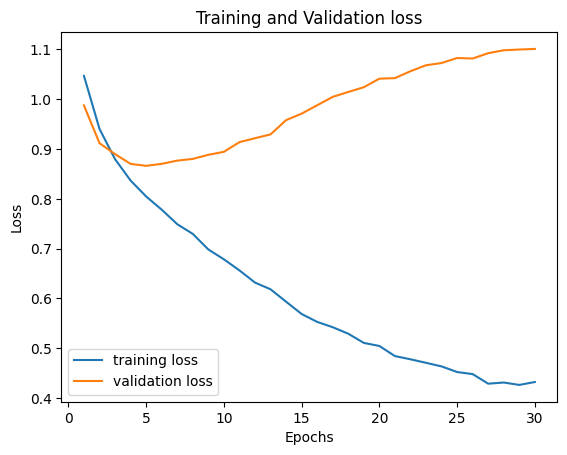

In [ ]:
from matplotlib import pyplot as plt
epochs = range(1, EPOCHS +1 )
fig, ax = plt.subplots()
ax.plot(epochs,train_loss_per_epoch,label ='training loss')
ax.plot(epochs, val_loss_per_epoch, label = 'validation loss' )
ax.set_title('Training and Validation loss')
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.legend()
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print('classifiation report')
print(classification_report(valid_pred, X_val['label'].to_numpy()))

classifiation report
              precision    recall  f1-score   support

           0       0.45      0.48      0.46       408
           1       0.62      0.63      0.63       376
           2       0.69      0.66      0.67       630

    accuracy                           0.60      1414
   macro avg       0.59      0.59      0.59      1414
weighted avg       0.60      0.60      0.60      1414



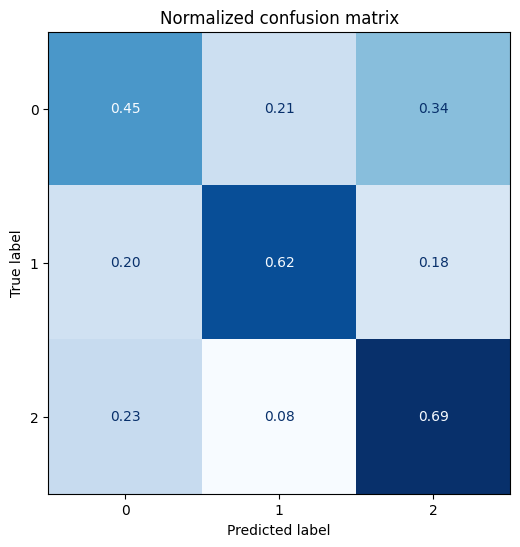

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
def plot_confusion_matrix(y_preds, y_true, labels=None):
  cm = confusion_matrix(y_true, y_preds, normalize="true")
  fig, ax = plt.subplots(figsize=(6, 6))
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels) 
  disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False) 
  plt.title("Normalized confusion matrix")
  plt.show()

plot_confusion_matrix(valid_pred, X_val['label'].to_numpy())

0it [00:00, ?it/s]

classifiation report
              precision    recall  f1-score   support

           0       0.51      0.57      0.54       499
           1       0.59      0.56      0.57       388
           2       0.71      0.68      0.69       777

    accuracy                           0.62      1664
   macro avg       0.60      0.60      0.60      1664
weighted avg       0.62      0.62      0.62      1664



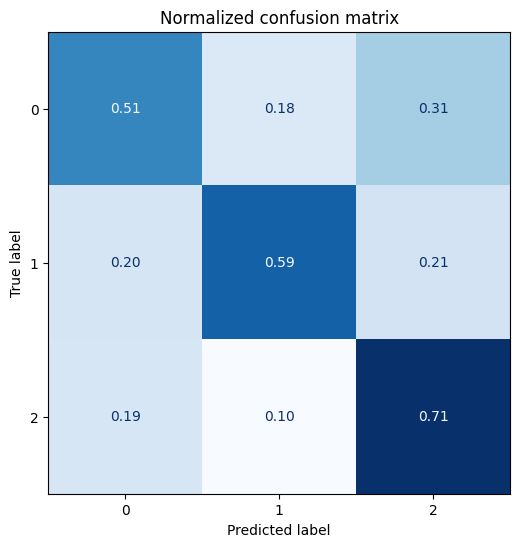

In [ ]:
model.eval()
test_pred = []
test_loss= 0
with torch.no_grad():
    for step_num, batch_data in tqdm(enumerate(test_dataloader)):
        input_ids, att_mask, labels = [data.to(device) for data in batch_data]
        output = model(input_ids = input_ids, attention_mask=att_mask, labels= labels)

        loss = output.loss
        test_loss += loss.item()
   
        test_pred.append(np.argmax(output.logits.cpu().detach().numpy(),axis=-1))
test_pred = np.concatenate(test_pred)

print('classifiation report')
print(classification_report(test_pred, X_test['label'].to_numpy()))
plot_confusion_matrix(test_pred, X_test['label'].to_numpy())

####Save the model

In [ ]:
torch.save(model.state_dict(), 'model.pth')

### CLASSIFICATION

In [ ]:
# Initialize the model
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from transformers import BertForSequenceClassification
import torch
from transformers import BertTokenizer
PRETRAINED_LM = "bert-base-uncased"
tokenizer = BertTokenizer.from_pretrained(PRETRAINED_LM, do_lower_case=True)
def encode(docs):
    '''
    This function takes list of texts and returns input_ids and attention_mask of texts
    '''
    encoded_dict = tokenizer.batch_encode_plus(docs, add_special_tokens=True, max_length=128, padding='max_length',
                            return_attention_mask=True, truncation=True, return_tensors='pt')
    input_ids = encoded_dict['input_ids']
    attention_masks = encoded_dict['attention_mask']
    return input_ids, attention_masks

# Load the model
N_labels = 3
BATCH_SIZE = 16
model = BertForSequenceClassification.from_pretrained("bert-base-uncased",
                                                      num_labels=N_labels,
                                                      output_attentions=False,
                                                      output_hidden_states=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.load_state_dict(torch.load("model.pth"))
model = model.to(device)

In [ ]:
# Create the dataframe from the file provided
#df_obama = pd.ExcelFile("obama.xls"). # if two separated files
#df_romney = pd.ExcelFile("romney.xls")
xls = pd.ExcelFile("sample-testdata.xlsx") # if one file
df_obama = pd.read_excel(xls, 'Obama', header=None)
df_romney = pd.read_excel(xls, 'Romney', header=None)

In [ ]:
# Rename the columns
df_obama = df_obama.drop(df_obama.columns[[0]], axis=1)
df_obama = df_obama.rename(columns={df_obama.columns[0]: 'text'})
df_romney = df_romney.drop(df_romney.columns[[0]], axis=1)
df_romney = df_romney.rename(columns={df_romney.columns[0]: 'text'})

In [ ]:
df_romney

,text
0,Insidious!<e>Mitt Romney</e>'s Bain Helped Phi...
1,Senior <e>Romney</e> Advisor Claims <e>Obama</...
2,.@WardBrenda @shortwave8669 @allanbourdius you...
3,<e>Mitt Romney</e> still doesn't <a>believe</a...


In [ ]:
# Clean the text
df_obama['clean_text'] = df_obama['text'].apply(clean)
df_obama['tokenized'] = df_obama['clean_text'].apply(word_tokenize)

# Clean the text
df_romney['clean_text'] = df_romney['text'].apply(clean)
df_romney['tokenized'] = df_romney['clean_text'].apply(word_tokenize)

In [ ]:
df_romney

,text,clean_text,tokenized
0,Insidious!<e>Mitt Romney</e>'s Bain Helped Phi...,insidious mitt romney bain helped philip morri...,"[insidious, mitt, romney, bain, helped, philip..."
1,Senior <e>Romney</e> Advisor Claims <e>Obama</...,senior romney advisor claims obama administrat...,"[senior, romney, advisor, claims, obama, admin..."
2,.@WardBrenda @shortwave8669 @allanbourdius you...,mean like romney cheated primary,"[mean, like, romney, cheated, primary]"
3,<e>Mitt Romney</e> still doesn't <a>believe</a...,mitt romney still not believe black president,"[mitt, romney, still, not, believe, black, pre..."


In [ ]:
# Prepare the elements to feed the neural network
input_ids, att_masks = encode(df_obama['clean_text'].values.tolist())
dataset = TensorDataset(input_ids, att_masks)
sampler = SequentialSampler(dataset)
dataloader = DataLoader(dataset, sampler=sampler, batch_size=BATCH_SIZE)
print('Input correctly vectorized')

# Classify the texts
model.eval()
test_pred = []
with torch.no_grad():
    for step_num, batch_data in tqdm(enumerate(dataloader)):
        input_ids, att_mask = [data.to(device) for data in batch_data]
        output = model(input_ids = input_ids, attention_mask=att_mask)
   
        test_pred.append(np.argmax(output.logits.cpu().detach().numpy(),axis=-1))
test_pred = np.concatenate(test_pred)
print(f'Classification done, {len(test_pred)} instances classified')

output = pd.DataFrame(test_pred, columns=['label'])
output.label = output.label.apply(lambda x: (-1) if x==2 else x)
output.index = output.index + 1
output.to_csv("obama.txt", sep=';', header=False)

# read the file and replace ',' with ';;'
with open('obama.txt', 'r') as file:
    data = file.read().replace(';', ';;')

# save the modified data to a new file
with open('obama.txt', 'w') as file:
    file.write(data)
    print(f'Output file created, {file.name}')

In [ ]:
# Prepare the elements to feed the neural network
input_ids, att_masks = encode(df_romney['clean_text'].values.tolist())
dataset = TensorDataset(input_ids, att_masks)
sampler = SequentialSampler(dataset)
dataloader = DataLoader(dataset, sampler=sampler, batch_size=BATCH_SIZE)
print('Input correctly vectorized')

# Classify the texts
model.eval()
test_pred = []
with torch.no_grad():
    for step_num, batch_data in tqdm(enumerate(dataloader)):
        input_ids, att_mask = [data.to(device) for data in batch_data]
        output = model(input_ids = input_ids, attention_mask=att_mask)
   
        test_pred.append(np.argmax(output.logits.cpu().detach().numpy(),axis=-1))
test_pred = np.concatenate(test_pred)

print(f'\nClassification done, {len(test_pred)} instances classified')

# Save the results
output = pd.DataFrame(test_pred, columns=['label'])
output.label = output.label.apply(lambda x: (-1) if x==2 else x)
output.index = output.index + 1
output.to_csv("romney.txt", sep=';', header=False)
with open('romney.txt', 'r') as file:
    data = file.read().replace(';', ';;')
with open('romney.txt', 'w') as file:
    file.write(data)
    print(f'Output file created, {file.name}')

### BERT

In [ ]:
# Prepare the dataset
X = df_obama.copy(deep=True)
Y = df_romney.copy(deep=True)
X = pd.concat([X,Y])
X['label'] = X['class'].apply(lambda x: 2 if x==-1 else x)

X_train, X_test, y_train, y_test = train_test_split(X, X['class'], test_size=0.2, random_state=0)

In [ ]:
y_train = y_train.astype('int')
y_test = y_test.astype('int')
# y_val = y_val.astype('int')

y_train = to_categorical(y_train, 3)
y_test = to_categorical(y_test, 3)
# y_val = to_categorical(y_val, 3)

In [ ]:
import pandas as pd
import numpy as np
import re
from keras.models import Sequential
from keras.layers import Dense, Dropout, Embedding, Conv1D, MaxPooling1D, LSTM


# Tokenize the data
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer(num_words=5000, lower=True)
tokenizer.fit_on_texts(X_train['clean_text'])
X_train_tok = tokenizer.texts_to_sequences(X_train['clean_text'])
X_train_tok = pad_sequences(X_train_tok, maxlen=100)

# Define the model architecture
model = Sequential()
model.add(Embedding(5000, 100, input_length=X_train_tok.shape[1]))
model.add(Dropout(0.2))
model.add(Conv1D(filters=64, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(100))
model.add(Dense(3, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

# Train the model
model.fit(X_train_tok, y_train, validation_split=0.2, epochs=5, batch_size=64)


In [ ]:
X_test_tok = tokenizer.texts_to_sequences(X_test['clean_text'])
X_test_tok = pad_sequences(X_test_tok, maxlen=100)
y_pred = (model.predict(X_test_tok)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

In [ ]:
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, Flatten, Dense
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
import numpy as np

tokenizer = Tokenizer(num_words=5000, lower=True)
tokenizer.fit_on_texts(X_train['clean_text'])
X_train_tok = tokenizer.texts_to_sequences(X_train['clean_text'])
X_train_tok = pad_sequences(X_train_tok, maxlen=100)

# Define the number of words in the vocabulary and the size of the word vectors
vocab_size = 10000
embedding_size = 100

# Define the CNN architecture
model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_size, input_length=X_train_tok.shape[1]))
model.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(units=64, activation='relu'))
model.add(Dense(units=3, activation='softmax'))

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

# Train the model
early_stopping = EarlyStopping(monitor='val_loss', patience=3)
history = model.fit(X_train_tok, y_train, validation_split=0.2, epochs=10, batch_size=32, callbacks=[early_stopping])


In [ ]:
X_test_tok = tokenizer.texts_to_sequences(X_test['clean_text'])
X_test_tok = pad_sequences(X_test_tok, maxlen=100)
y_pred = (model.predict(X_test_tok)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from collections import defaultdict
from textwrap import wrap

# Torch ML libraries
import transformers
from transformers import BertModel, BertTokenizer, AdamW, get_linear_schedule_with_warmup
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader

# Misc.
import warnings
warnings.filterwarnings('ignore')
# Set intial variables and constants
%config InlineBackend.figure_format='retina'

# Graph Designs
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))
rcParams['figure.figsize'] = 12, 8

# Random seed for reproducibilty
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

# Set GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set the model name
MODEL_NAME = 'bert-base-cased'

# Build a BERT based tokenizer
tokenizer = BertTokenizer.from_pretrained(MODEL_NAME)

In [ ]:
# Store length of each review 
token_lens = []

# Iterate through the content slide
for txt in X.clean_text:
    tokens = tokenizer.encode(txt, max_length=512)
    token_lens.append(len(tokens))

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


In [ ]:
# plot the distribution of review lengths 
sns.distplot(token_lens)
plt.xlim([0, 256]);
plt.xlabel('Token count')

In [ ]:
MAX_LEN = 60
class GPReviewDataset(Dataset):
    # Constructor Function 
    def __init__(self, reviews, targets, tokenizer, max_len):
        self.reviews = reviews
        self.targets = targets
        self.tokenizer = tokenizer
        self.max_len = max_len
    
    # Length magic method
    def __len__(self):
        return len(self.reviews)
    
    # get item magic method
    def __getitem__(self, item):
        review = str(self.reviews[item])
        target = self.targets[item]
        
        # Encoded format to be returned 
        encoding = self.tokenizer.encode_plus(
            review,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            pad_to_max_length=True,
            return_attention_mask=True,
            return_tensors='pt',
        )
        
        return {
            'review_text': review,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'targets': torch.tensor(target, dtype=torch.long)
        }

def create_data_loader(df, tokenizer, max_len, batch_size):
    ds = GPReviewDataset(
        reviews=df.clean_text.to_numpy(),
        targets=df.label.to_numpy(),
        tokenizer=tokenizer,
        max_len=max_len
    )
    
    return DataLoader(
        ds,
        batch_size=batch_size,
        num_workers=0
    )

In [ ]:
df_train, df_test = train_test_split(X, test_size=0.2, random_state=RANDOM_SEED)
df_val, df_test = train_test_split(df_test, test_size=0.5, random_state=RANDOM_SEED)

print(df_train.shape, df_val.shape, df_test.shape)

(8871, 7) (1109, 7) (1109, 7)


In [ ]:
# Create train, test and val data loaders
BATCH_SIZE = 16
train_data_loader = create_data_loader(df_train, tokenizer, MAX_LEN, BATCH_SIZE)
val_data_loader = create_data_loader(df_val, tokenizer, MAX_LEN, BATCH_SIZE)
test_data_loader = create_data_loader(df_test, tokenizer, MAX_LEN, BATCH_SIZE)

In [ ]:
data = next(iter(train_data_loader))
print(data.keys())

print(data['input_ids'].shape)
print(data['attention_mask'].shape)
print(data['targets'].shape)

In [ ]:
# Load the basic BERT model 
bert_model = BertModel.from_pretrained(MODEL_NAME)

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
# Build the Sentiment Classifier class 
class SentimentClassifier(nn.Module):
    
    # Constructor class 
    def __init__(self, n_classes):
        super(SentimentClassifier, self).__init__()
        self.bert = BertModel.from_pretrained(MODEL_NAME, return_dict=False)
        self.drop = nn.Dropout(p=0.3)
        self.out = nn.Linear(self.bert.config.hidden_size, n_classes)
    
    # Forward propagaion class
    def forward(self, input_ids, attention_mask):
        _, pooled_output = self.bert(
          input_ids=input_ids,
          attention_mask=attention_mask
        )
        #  Add a dropout layer 
        output = self.drop(pooled_output)
        return self.out(output)

In [ ]:
# Instantiate the model and move to classifier
model = SentimentClassifier(3)
model = model.to(device)

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
# Number of iterations 
EPOCHS = 10

# Optimizer Adam 
optimizer = AdamW(model.parameters(), lr=2e-5, correct_bias=False)

total_steps = len(train_data_loader) * EPOCHS

scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps=0,
    num_training_steps=total_steps
)

# Set the loss function 
loss_fn = nn.CrossEntropyLoss().to(device)

# Function for a single training iteration
def train_epoch(model, data_loader, loss_fn, optimizer, device, scheduler, n_examples):
    model = model.train()
    losses = []
    correct_predictions = 0
    
    for d in data_loader:
        input_ids = d["input_ids"].to(device)
        attention_mask = d["attention_mask"].to(device)
        targets = d["targets"].to(device)
        
        outputs = model(
            input_ids=input_ids,
            attention_mask=attention_mask
        )
        
        _, preds = torch.max(outputs, dim=1)
        loss = loss_fn(outputs, targets)
        correct_predictions += torch.sum(preds == targets)
        losses.append(loss.item())

        # Backward prop
        loss.backward()
        
        # Gradient Descent
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()
    
    return correct_predictions.double() / n_examples, np.mean(losses)


def eval_model(model, data_loader, loss_fn, device, n_examples):
    model = model.eval()
    
    losses = []
    correct_predictions = 0
    
    with torch.no_grad():
        for d in data_loader:
            input_ids = d["input_ids"].to(device)
            attention_mask = d["attention_mask"].to(device)
            targets = d["targets"].to(device)
            
            # Get model ouptuts
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )
            
            _, preds = torch.max(outputs, dim=1)
            loss = loss_fn(outputs, targets)
            
            correct_predictions += torch.sum(preds == targets)
            losses.append(loss.item())
            
    return correct_predictions.double() / n_examples, np.mean(losses)

In [ ]:
%%time

history = defaultdict(list)
best_accuracy = 0

for epoch in range(EPOCHS):
    
    # Show details 
    print(f"Epoch {epoch + 1}/{EPOCHS}")
    print("-" * 10)
    
    train_acc, train_loss = train_epoch(
        model,
        train_data_loader,
        loss_fn,
        optimizer,
        device,
        scheduler,
        len(df_train)
    )
    
    print(f"Train loss {train_loss} accuracy {train_acc}")
    
    # Get model performance (accuracy and loss)
    val_acc, val_loss = eval_model(
        model,
        val_data_loader,
        loss_fn,
        device,
        len(df_val)
    )
    
    print(f"Val   loss {val_loss} accuracy {val_acc}")
    print()
    
    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)
    
    # If we beat prev performance
    if val_acc > best_accuracy:
        torch.save(model.state_dict(), 'best_model_state.bin')
        best_accuracy = val_acc

Epoch 1/10
----------
Train loss 0.9765645394454131 accuracy 0.52361627775899
Val   loss 0.8880453952721187 accuracy 0.5843101893597835

Epoch 2/10
----------
Train loss 0.7948584255871473 accuracy 0.659001239995491
Val   loss 0.9236360481807164 accuracy 0.6005410279531109

Epoch 3/10
----------
Train loss 0.5854868854622584 accuracy 0.775335362416864
Val   loss 1.07316790244409 accuracy 0.5933273219116321

Epoch 4/10
----------
Train loss 0.4178371989680035 accuracy 0.8475932814789765
Val   loss 1.302205676478999 accuracy 0.5897204688908927

Epoch 5/10
----------
Train loss 0.3072257026593696 accuracy 0.8997858189606583
Val   loss 1.4627215187996625 accuracy 0.5969341749323714

Epoch 6/10
----------
Train loss 0.24495551035370308 accuracy 0.92233119152294
Val   loss 1.79390504597021 accuracy 0.6005410279531109

Epoch 7/10
----------
Train loss 0.2106772279748609 accuracy 0.9380002254537256
Val   loss 1.9744873233139515 accuracy 0.5843101893597835

Epoch 8/10
----------
Train loss 0.17

In [ ]:
test_acc, _ = eval_model(
  model,
  test_data_loader,
  loss_fn,
  device,
  len(df_test)
)

test_acc.item()

0.5924256086564472

### Neural nets

In [ ]:
X = df_obama.copy(deep=True)
Y = df_romney.copy(deep=True)
X = pd.concat([X,Y])
X['class'] = X['class'].apply(lambda x: 2 if x==-1 else x)
X_train, X_test, y_train, y_test = train_test_split(X['clean_text'], X['class'], test_size=0.1, random_state=0)
X_train, X_val, y_train, y_val = train_test_split(X['clean_text'], X['class'], test_size=0.1, random_state=0)

y_train = y_train.astype('int')
y_test = y_test.astype('int')
y_val = y_val.astype('int')

In [ ]:
max_words = 10000
max_len = 10000

tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)

X_train_vec = tokenizer.texts_to_sequences(X_train)
X_train_vec = pad_sequences(X_train_vec, maxlen=max_len)

X_val_vec = tokenizer.texts_to_sequences(X_val)
X_val_vec = pad_sequences(X_val_vec, maxlen=max_len)

X_test_vec = tokenizer.texts_to_sequences(X_test)
X_test_vec = pad_sequences(X_test_vec, maxlen=max_len)

y_train = to_categorical(y_train, 3)
y_test = to_categorical(y_test, 3)
y_val = to_categorical(y_val, 3)

In [ ]:
vectorizer = TfidfVectorizer(min_df=20,ngram_range=(1,4), max_features=250)
vectorizer.fit(X_train) 
X_train_vec = vectorizer.transform(X_train)
X_test_vec = vectorizer.transform(X_test)
X_val_vec = vectorizer.transform(X_val)

X_train_vec = X_train_vec.todense()
X_test_vec = X_test_vec.todense()
X_val_vec = X_val_vec.todense()

y_train = to_categorical(y_train, 3)
y_test = to_categorical(y_test, 3)
y_val = to_categorical(y_val, 3)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.initializers import RandomNormal

batch_size = 256  
hidden_units = 64
dropout = 0.2

model = Sequential()
model.add(Dense(hidden_units, input_dim=X_train_vec.shape[1], activation='relu',
          kernel_initializer='he_uniform'))
model.add(Dropout(dropout))
model.add(Dense(64,activation='relu',
        kernel_initializer='he_uniform'))
model.add(Dropout(dropout))
model.add(Dense(3))
model.add(Activation('sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam')
checkpoint1 = ModelCheckpoint("best_model1.hdf5", monitor='val_accuracy', verbose=0, save_best_only=True, mode='auto', period=1, save_weights_only=False)
history = model.fit(X_train_vec, y_train, epochs=70, validation_data=(X_val_vec, y_val),callbacks=[checkpoint1])

In [ ]:
y_pred = (model.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

In [ ]:
model1 = Sequential()
model1.add(layers.Embedding(max_words, 20)) #The embedding layer
model1.add(layers.LSTM(15,dropout=0.5)) #Our LSTM layer
model1.add(layers.Dense(3,activation='softmax'))

model1.compile(optimizer='adam',loss='categorical_crossentropy', metrics=['accuracy'])
K.set_value(model1.optimizer.learning_rate, 0.01)
checkpoint1 = ModelCheckpoint("best_model1.hdf5", monitor='val_accuracy', verbose=1,save_best_only=True, mode='auto', period=1,save_weights_only=False)
history = model1.fit(X_train_vec, y_train, epochs=70, validation_data=(X_val_vec, y_val),callbacks=[checkpoint1])

In [ ]:
y_pred = (model1.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

In [ ]:
model1 = Sequential()
model1.add(layers.Embedding(max_words, 20)) #The embedding layer
model1.add(layers.LSTM(15,dropout=0.5)) #Our LSTM layer
model1.add(layers.Dense(3,activation='softmax'))

model1.compile(optimizer='adam',loss='categorical_crossentropy', metrics=['accuracy'])
K.set_value(model1.optimizer.learning_rate, 0.0086)
checkpoint1 = ModelCheckpoint("best_model1.hdf5", monitor='val_accuracy', verbose=1,save_best_only=True, mode='auto', period=1,save_weights_only=False)
history = model1.fit(X_train_vec, y_train, epochs=70, validation_data=(X_val_vec, y_val),callbacks=[checkpoint1])

In [ ]:
y_pred = (model1.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

In [ ]:
model1 = Sequential()
model1.add(layers.Embedding(max_words, 20)) #The embedding layer
model1.add(layers.LSTM(15,dropout=0.5)) #Our LSTM layer
model1.add(layers.Dense(3,activation='softmax'))

model1.compile(optimizer='sgd',loss='categorical_crossentropy', metrics=['accuracy'])
K.set_value(model1.optimizer.learning_rate, 0.001)
checkpoint1 = ModelCheckpoint("best_model1.hdf5", monitor='val_accuracy', verbose=1,save_best_only=True, mode='auto', period=1,save_weights_only=False)
history = model1.fit(X_train_vec, y_train, epochs=70, validation_data=(X_val_vec, y_val),callbacks=[checkpoint1])

In [ ]:
y_pred = (model1.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

In [ ]:
model1 = Sequential()
model1.add(layers.Embedding(max_words, 20)) #The embedding layer
model1.add(layers.LSTM(15,dropout=0.5)) #Our LSTM layer
model1.add(layers.Dense(3,activation='softmax'))

model1.compile(optimizer='sgd',loss='categorical_crossentropy', metrics=['accuracy'])
K.set_value(model1.optimizer.learning_rate, 0.02)
checkpoint1 = ModelCheckpoint("best_model1.hdf5", monitor='val_accuracy', verbose=1,save_best_only=True, mode='auto', period=1,save_weights_only=False)
history = model1.fit(X_train_vec, y_train, epochs=70, validation_data=(X_val_vec, y_val),callbacks=[checkpoint1])

In [ ]:
y_pred = (model1.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

35/35 [==============================] - 1s 5ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       395
           1       0.00      0.00      0.00       228
           2       0.44      1.00      0.61       486

    accuracy                           0.44      1109
   macro avg       0.15      0.33      0.20      1109
weighted avg       0.19      0.44      0.27      1109



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model1 = Sequential()
model1.add(layers.Embedding(max_words, 20)) #The embedding layer
model1.add(layers.LSTM(15,dropout=0.5)) #Our LSTM layer
model1.add(layers.Dense(3,activation='softmax'))

model1.compile(optimizer='rmsprop',loss='categorical_crossentropy', metrics=['accuracy'])
checkpoint1 = ModelCheckpoint("best_model1.hdf5", monitor='val_accuracy', verbose=1,save_best_only=True, mode='auto', period=1,save_weights_only=False)
history = model1.fit(X_train_vec, y_train, epochs=70, validation_data=(X_val_vec, y_val),callbacks=[checkpoint1])

In [ ]:
y_pred = (model1.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))


In [ ]:
# best
import tensorflow as tf
tf.random.set_seed(42)
model2 = Sequential()
model2.add(layers.Embedding(max_words, 40, input_length=max_len))
model2.add(layers.Bidirectional(layers.LSTM(20, dropout=0.6)))
model2.add(layers.Dense(3,activation='softmax'))
model2.compile(optimizer='rmsprop',loss='categorical_crossentropy', metrics=['accuracy'])
checkpoint2 = ModelCheckpoint("best_model2.hdf5", monitor='val_accuracy', verbose=1, save_best_only=True, mode='auto', period=1, save_weights_only=False)
K.set_value(model2.optimizer.learning_rate, 0.0086)
history = model2.fit(X_train_vec, y_train, epochs=70, validation_data=(X_val_vec, y_val),callbacks=[checkpoint2])

In [ ]:
y_pred = (model2.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

In [ ]:
model2 = Sequential()
model2.add(layers.Embedding(max_words, 40, input_length=max_len))
model2.add(layers.Bidirectional(layers.LSTM(20, dropout=0.6)))
model2.add(layers.Dense(3,activation='softmax'))

model2.compile(
    loss=tf.keras.losses.binary_crossentropy,
    optimizer=tf.keras.optimizers.Adam(),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name='accuracy')
    ]
)

initial_history = model2.fit(
    X_train_vec,
    y_train,
    epochs=100,
    callbacks=[
        tf.keras.callbacks.LearningRateScheduler(
            lambda epoch: 1e-3 * 10 ** ((epoch) / 30)
        )
    ]
)

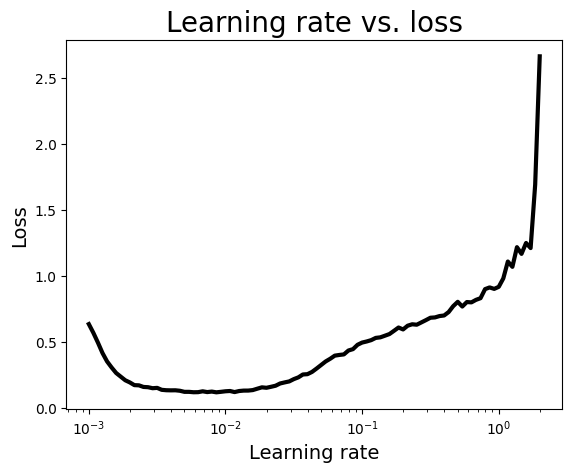

In [ ]:
learning_rates = 1e-3 * (10 ** (np.arange(100) / 30))
plt.semilogx(
    learning_rates, 
    initial_history.history['loss'], 
    lw=3, color='#000'
)
plt.title('Learning rate vs. loss', size=20)
plt.xlabel('Learning rate', size=14)
plt.ylabel('Loss', size=14);

In [ ]:
model3 = Sequential()
model3.add(layers.Embedding(max_words, 40, input_length=max_len))
model3.add(layers.Conv1D(20, 6, activation='relu',kernel_regularizer=regularizers.l1_l2(l1=2e-3, l2=2e-3),bias_regularizer=regularizers.l2(2e-3)))
model3.add(layers.MaxPooling1D(5))
model3.add(layers.Conv1D(20, 6, activation='relu',kernel_regularizer=regularizers.l1_l2(l1=2e-3, l2=2e-3),bias_regularizer=regularizers.l2(2e-3)))
model3.add(layers.GlobalMaxPooling1D())
model3.add(layers.Dense(3,activation='softmax'))
model3.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['acc'])
history = model3.fit(X_train_vec, y_train, epochs=70, validation_data=(X_val_vec, y_val))

In [ ]:
y_pred = (model3.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

In [ ]:
model = Sequential()
# Input - Layer
model.add(layers.Dense(50, activation = "relu", input_shape=(10000, )))
# Hidden - Layers
model.add(layers.Dropout(0.3, noise_shape=None, seed=None))
model.add(layers.Dense(50, activation = "relu"))
model.add(layers.Dropout(0.2, noise_shape=None, seed=None))
model.add(layers.Dense(50, activation = "relu"))
# Output- Layer
model.add(layers.Dense(3, activation = "sigmoid"))
model.compile(
  optimizer = "adam",
  loss = "binary_crossentropy",
  metrics = ["accuracy"]
)
results = model.fit(
  X_train_vec, y_train,
  epochs= 70,
  batch_size = 32,
  validation_data = (X_val_vec, y_val)
)

In [ ]:
y_pred = (model.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(50, activation = "relu", input_shape=(10000, )),
    tf.keras.layers.Dense(12, input_dim=10000, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dropout(0.1),
    tf.keras.layers.Dense(12, activation='relu'),
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dense(3, activation='sigmoid')
])

#Compile the model so it can be trained
model.compile(
     loss='categorical_crossentropy',
     optimizer='adam',
     metrics=['accuracy']
)

results = model.fit(
  X_train_vec, y_train,
  epochs= 70,
  batch_size = 32,
  validation_data = (X_val_vec, y_val)
)

In [ ]:
y_pred = (model.predict(X_test_vec)).argmax(axis=1)
print(classification_report(y_test.argmax(axis=1), y_pred))

### Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

# Training
model = GaussianNB()
model.fit(train_vecs.toarray(), y_train)

# Testing
y_pred = model.predict(test_vecs.toarray())

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.59      0.52      0.56       975
           0       0.45      0.42      0.43       719
           1       0.41      0.55      0.47       524

    accuracy                           0.49      2218
   macro avg       0.48      0.49      0.49      2218
weighted avg       0.50      0.49      0.50      2218



### Support Vector Machine

In [ ]:
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('svm', svm.SVC(kernel='rbf', class_weight='balanced')),
])
parameters = {
    'svm__gamma': (0.1, 0.3, 0.8),
    'svm__C': (0.2, 0.6, 0.8, 10)
}
'''parameters = {
    'svm__gamma': (0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9),
    'svm__C': (0.2, 0.4, 0.6, 0.8, 0.9, 1, 2, 5, 10)
}'''

grid_search_tune = GridSearchCV(pipeline, parameters, cv=10, n_jobs=2, verbose=3)
grid_search_tune.fit(X_train_raw, y_train)

print("Best parameters set:")
print(grid_search_tune.best_estimator_.steps)

In [ ]:
# Training
rbf = svm.SVC(kernel='rbf', gamma=0.8, C=0.8, class_weight='balanced').fit(train_vecs, y_train)
poly = svm.SVC(kernel='poly', degree=4, C=10).fit(train_vecs, y_train)
linear = svm.SVC(kernel='linear', class_weight='balanced').fit(train_vecs, y_train)

# Testing
poly_pred = poly.predict(test_vecs)
rbf_pred = rbf.predict(test_vecs)
linear_pred = linear.predict(test_vecs)

In [ ]:
# Results
print(classification_report(y_test, poly_pred))
print(classification_report(y_test, rbf_pred))
print(classification_report(y_test, linear_pred))

              precision    recall  f1-score   support

          -1       0.48      0.94      0.63       975
           0       0.61      0.13      0.22       719
           1       0.68      0.18      0.29       524

    accuracy                           0.50      2218
   macro avg       0.59      0.42      0.38      2218
weighted avg       0.57      0.50      0.42      2218

              precision    recall  f1-score   support

          -1       0.64      0.71      0.67       975
           0       0.55      0.47      0.51       719
           1       0.58      0.58      0.58       524

    accuracy                           0.60      2218
   macro avg       0.59      0.59      0.59      2218
weighted avg       0.60      0.60      0.60      2218

              precision    recall  f1-score   support

          -1       0.65      0.66      0.65       975
           0       0.54      0.46      0.50       719
           1       0.54      0.63      0.58       524

    accuracy        

### Decision Tree

In [ ]:
# Training
rf = RandomForestClassifier(n_estimators=400, random_state=11).fit(train_vecs, y_train)

In [ ]:
# Testing
rf_pred = rf.predict(test_vecs)

In [ ]:
# Results
print(classification_report(y_test, rf_pred))

              precision    recall  f1-score   support

          -1       0.61      0.71      0.66       975
           0       0.55      0.41      0.47       719
           1       0.55      0.58      0.56       524

    accuracy                           0.58      2218
   macro avg       0.57      0.57      0.56      2218
weighted avg       0.58      0.58      0.58      2218



### Extreme gradient boosting

In [ ]:
y_train_enc = LabelEncoder().fit_transform(y_train)
y_test_enc = LabelEncoder().fit_transform(y_test)

# Training
xgbModel = XGBClassifier(Max_depth=6, n_estimators=1000)
xgbModel.fit(train_vecs, y_train_enc)

# Testing
Prediction = xgbModel.predict(test_vecs)

[04:49:52] WARNING: ../src/learner.cc:767: 
Parameters: { "Max_depth" } are not used.



In [ ]:
# Results
print(classification_report(y_test_enc, Prediction))

              precision    recall  f1-score   support

           0       0.63      0.60      0.62       975
           1       0.46      0.42      0.44       719
           2       0.47      0.58      0.52       524

    accuracy                           0.54      2218
   macro avg       0.52      0.53      0.53      2218
weighted avg       0.54      0.54      0.54      2218



### Summary

In [ ]:
algo = ['XGB', 'Decision Tree', 'SVM_poly',
        'SVM_rbf', 'SVM_linear', 'Naive Bayes', 'BERT model']
acc = [54, 58, 50, 60, 59, 49, 62]
f1 = [[52, 62, 44], #-1, 0, 1
      [66, 47, 56],
      [63, 22, 29],
      [67, 51, 58],
      [65, 50, 58],
      [56, 43, 47],
      [54, 57, 69]]

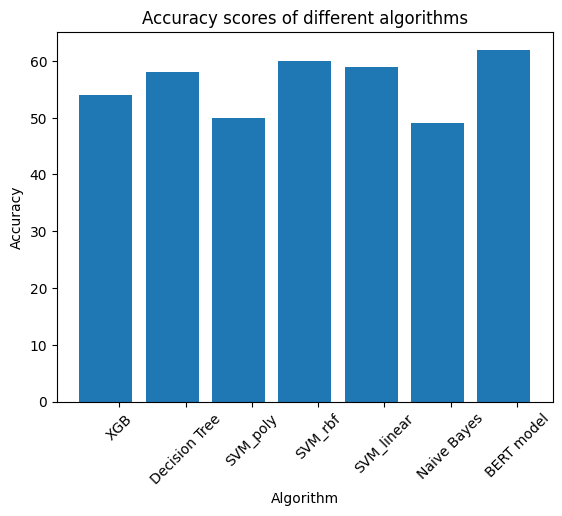

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

algo = ['XGB', 'Decision Tree', 'SVM_poly',
        'SVM_rbf', 'SVM_linear', 'Naive Bayes', 'BERT model']
acc = [54, 58, 50, 60, 59, 49, 62]
f1 = [[52, 62, 44],  # -1, 0, 1
      [66, 47, 56],
      [63, 22, 29],
      [67, 51, 58],
      [65, 50, 58],
      [56, 43, 47],
      [54, 57, 69]]

# Plotting the first figure
plt.figure()
plt.bar(algo, acc, )
plt.title('Accuracy scores of different algorithms')
plt.xlabel('Algorithm')
plt.xticks(x + bar_width, algo, rotation=45)
plt.ylabel('Accuracy')

plt.show()


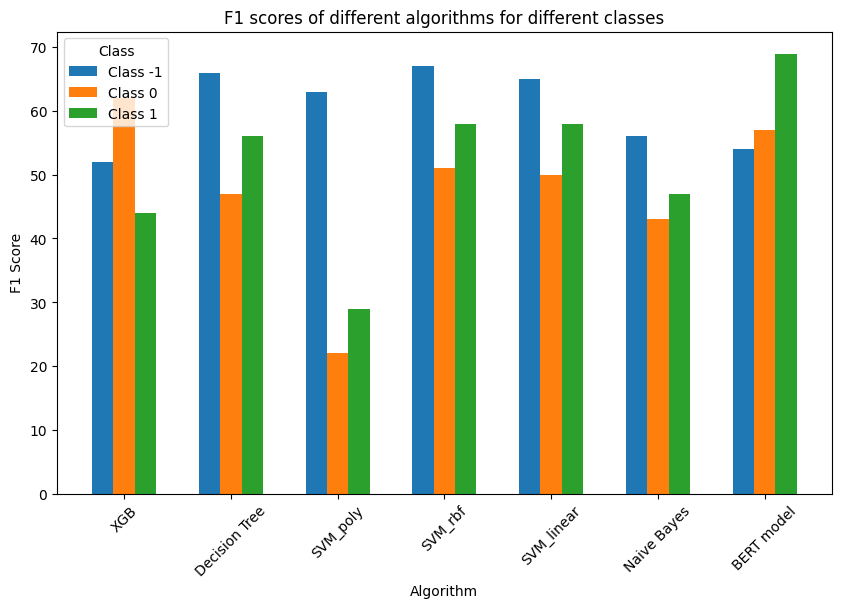

In [ ]:
# Plotting the second figure as a bar chart
plt.figure(figsize=(10, 6))
num_classes = 3
bar_width = 0.2
x = np.arange(len(algo))
for i in range(num_classes):
    plt.bar(x + i*bar_width, [f1[j][i] for j in range(len(algo))], bar_width, label=f"Class {i-1}")
plt.title('F1 scores of different algorithms for different classes')
plt.xlabel('Algorithm')
plt.ylabel('F1 Score')
plt.xticks(x + bar_width, algo, rotation=45)
plt.legend(title="Class", loc="upper left")
plt.show()

# Data visualization


In [ ]:
df = pd.concat([df_obama, df_romney])

## Classes distribution

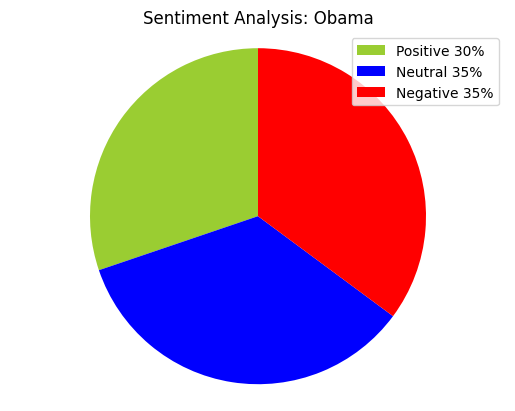

In [ ]:
# Visualize classes - Obama
n = df_obama.shape[0]
neutral = df_obama[df_obama['class'] == 0]
positive = df_obama[df_obama['class'] == 1]
negative = df_obama[df_obama['class'] == -1]
labels = [f'Positive {round(positive.shape[0] * 100 / n)}%', f'Neutral {round(neutral.shape[0] * 100 / n)}%', f'Negative {round(negative.shape[0] * 100 / n)}%']
sizes = [positive.shape[0], neutral.shape[0], negative.shape[0]]
colors = ['yellowgreen', 'blue', 'red']
patches, texts = plt.pie(sizes,colors=colors, startangle=90)
plt.style.use('default')
plt.legend(labels)
plt.title('Sentiment Analysis: Obama')
plt.axis('equal')
plt.show()

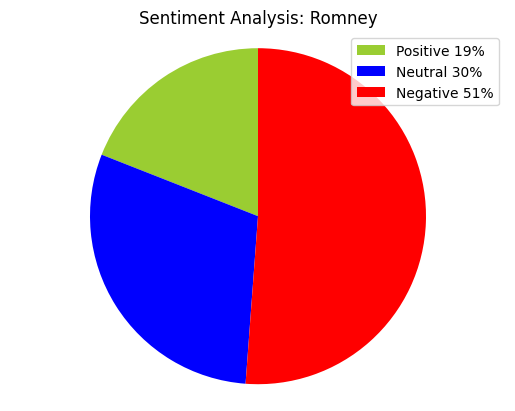

In [ ]:
# Visualize classes - Romney
n = df_romney.shape[0]
neutral = df_romney[df_romney['class'] == 0]
positive = df_romney[df_romney['class'] == 1]
negative = df_romney[df_romney['class'] == -1]
labels = [f'Positive {round(positive.shape[0] * 100 / n)}%', f'Neutral {round(neutral.shape[0] * 100 / n)}%', f'Negative {round(negative.shape[0] * 100 / n)}%']
sizes = [positive.shape[0], neutral.shape[0], negative.shape[0]]
colors = ['yellowgreen', 'blue', 'red']
patches, texts = plt.pie(sizes,colors=colors, startangle=90)
plt.style.use('default')
plt.legend(labels)
plt.title('Sentiment Analysis: Romney')
plt.axis('equal')
plt.show()

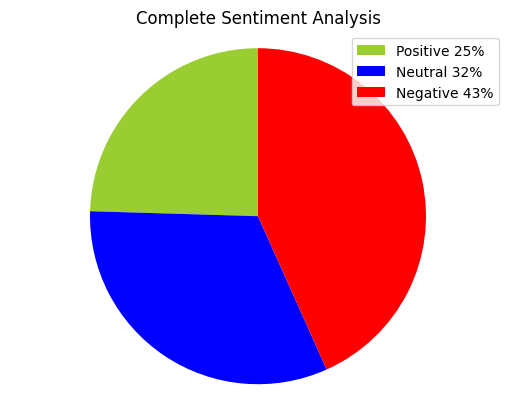

In [ ]:
# Visualize classes - both
n = df.shape[0]
neutral = df[df['class'] == 0]
positive = df[df['class'] == 1]
negative = df[df['class'] == -1]
labels = [f'Positive {round(positive.shape[0] * 100 / n)}%', f'Neutral {round(neutral.shape[0] * 100 / n)}%', f'Negative {round(negative.shape[0] * 100 / n)}%']
sizes = [positive.shape[0], neutral.shape[0], negative.shape[0]]
colors = ['yellowgreen', 'blue', 'red']
patches, texts = plt.pie(sizes,colors=colors, startangle=90)
plt.style.use('default')
plt.legend(labels)
plt.title('Complete Sentiment Analysis')
plt.axis('equal')
plt.show()

## Information about Obama

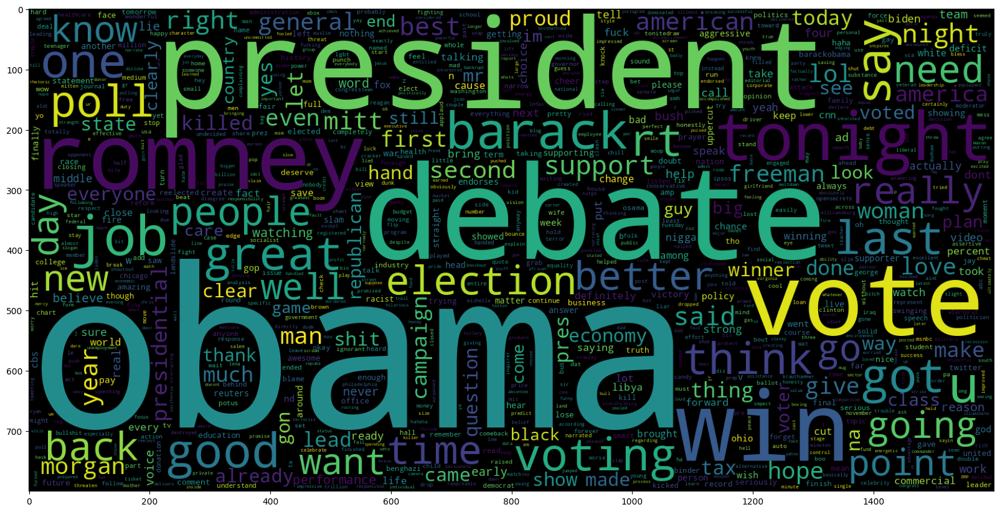

In [ ]:
data_pos = df_obama[df_obama['class']==1].iloc[:,4]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_pos))
plt.imshow(wc)

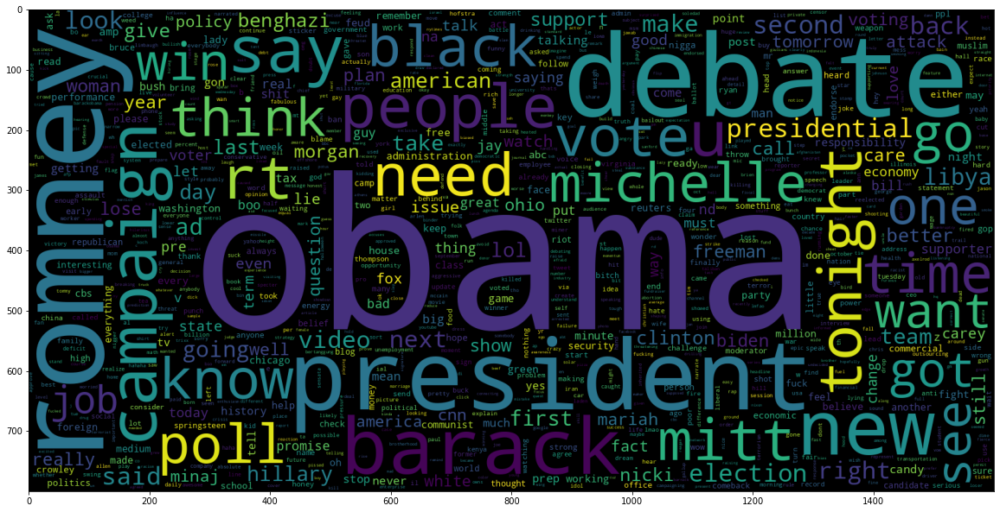

In [ ]:
data_neu = df_obama[df_obama['class']==0].iloc[:,4]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_neu))
plt.imshow(wc)

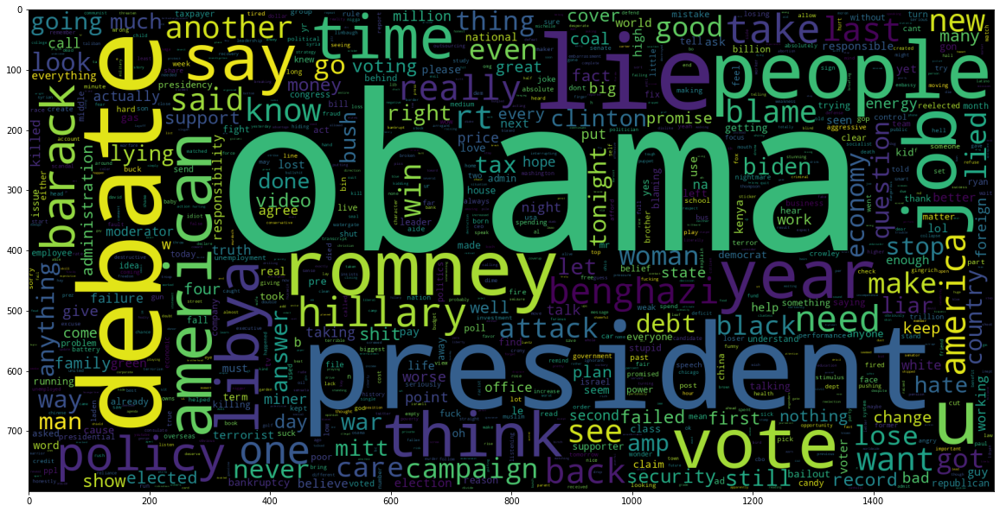

In [ ]:
data_neg = df_obama[df_obama['class']==-1].iloc[:,4]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_neg))
plt.imshow(wc)

## Information about Romney

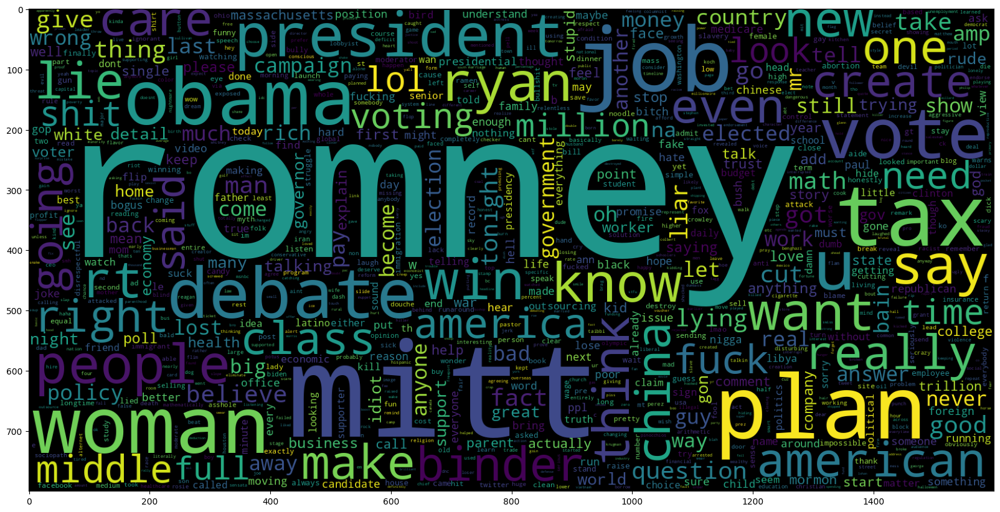

In [ ]:
data_neg = df_romney[df_romney['class']==-1].iloc[:,4]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_neg))
plt.imshow(wc)

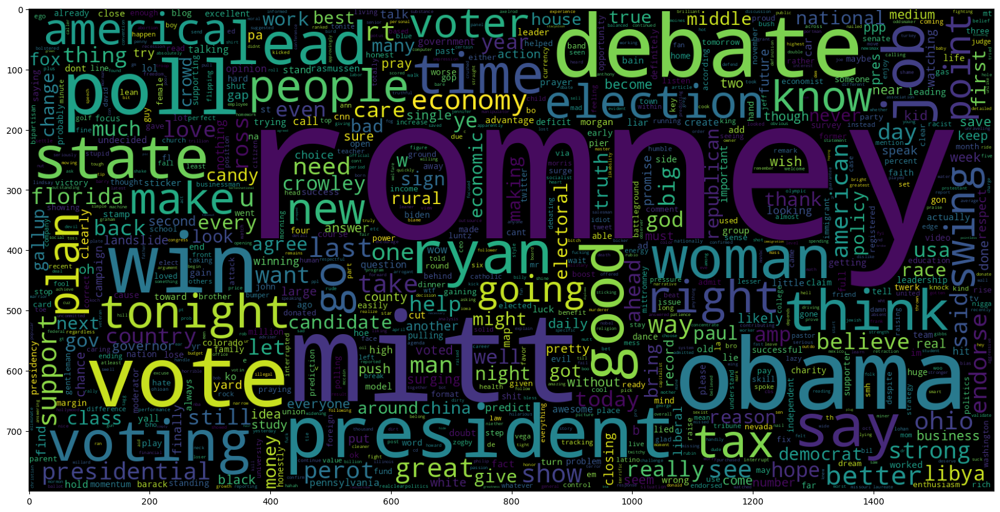

In [ ]:
data_pos = df_romney[df_romney['class']==1].iloc[:,4]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_pos))
plt.imshow(wc)

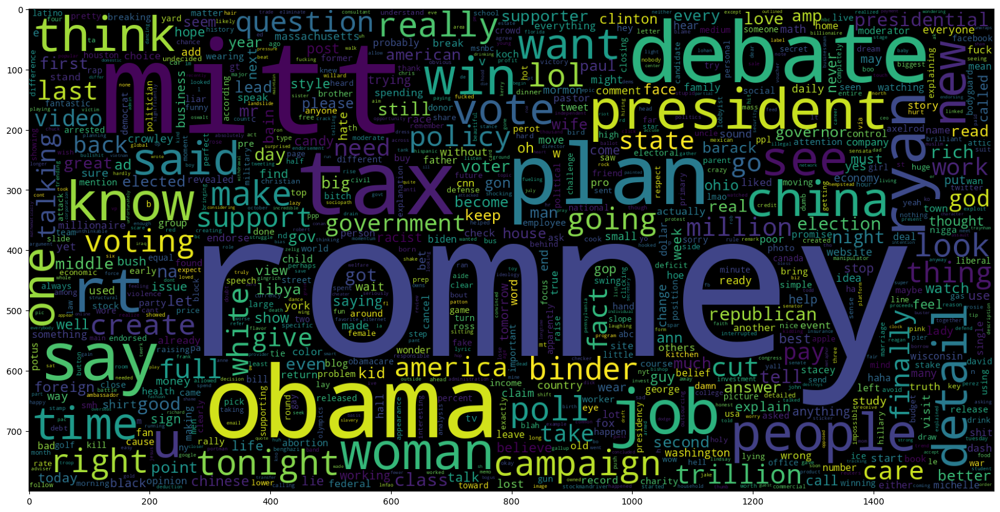

In [ ]:
data_neu = df_romney[df_romney['class']==0].iloc[:,4]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_neu))
plt.imshow(wc)

## Information about both

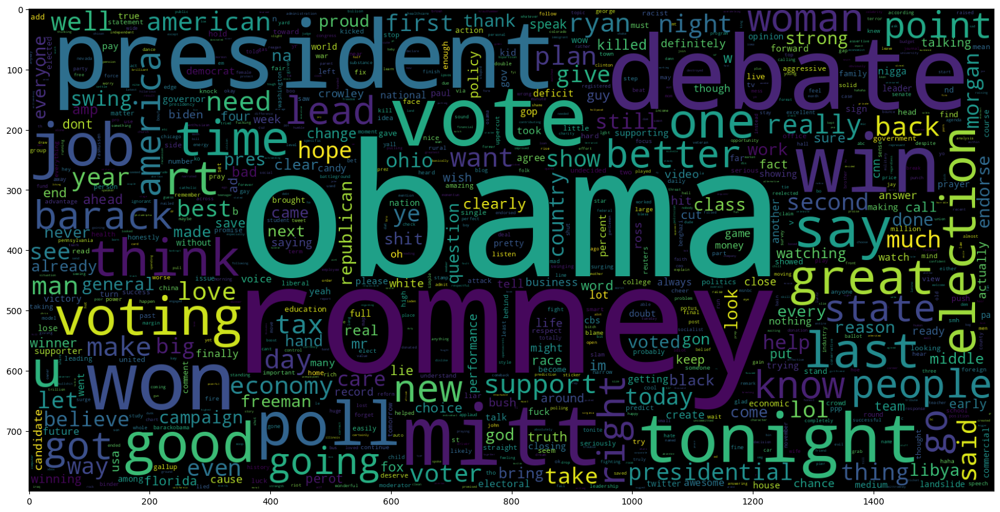

In [ ]:
data_pos = df[df['class']==1].iloc[:,4]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_pos))
plt.imshow(wc)

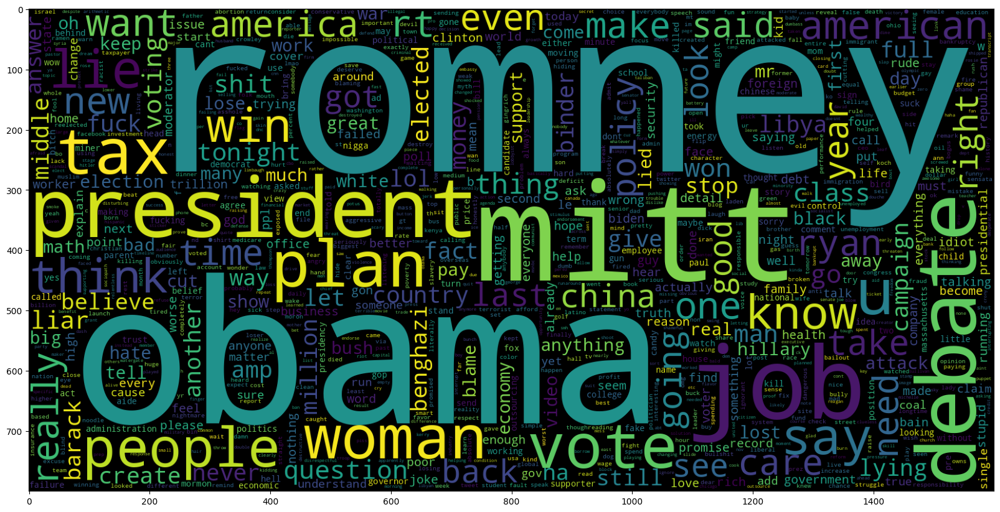

In [ ]:
data_neg = df[df['class']==-1].iloc[:,4]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_neg))
plt.imshow(wc)

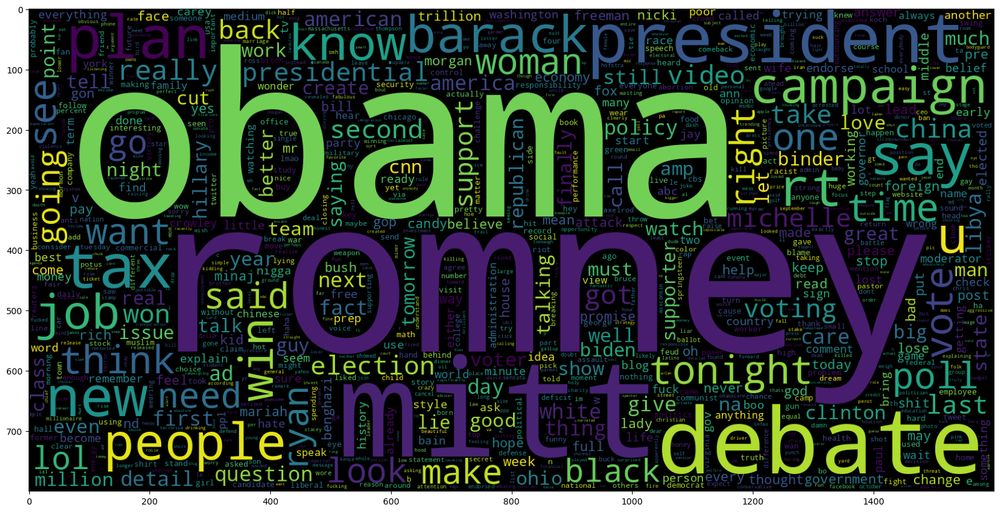

In [ ]:
data_neu = df[df['class']==0].iloc[:,4]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_neu))
plt.imshow(wc)